# Unsupervised Learning: Autoencoders. Part 2


---

**Name:** Kahla Maha 

---


# Environment setup

Import required modules.

In [ ]:
import numpy as np

import torch
from torch import nn
from torch.nn import functional as TF
import torchvision.transforms.functional as TVF
from torch import optim

from torchvision import models, transforms
from torchsummary import summary

import time
import math
import random

from torch.utils.data import TensorDataset, DataLoader, Dataset
from sklearn.metrics import accuracy_score

import seaborn as sns
from matplotlib import colors, pyplot as plt
from matplotlib import rcParams
from IPython.display import clear_output

from tqdm import tqdm

%matplotlib inline
rcParams['figure.figsize'] = (15,4)
sns.set(style="darkgrid", font_scale=1.4)

For reproducibility of the results, fix seed parameter in random number generators.

In [ ]:
SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True

The GPU can be used to accelerate training. For convenience, let's create a special variable.

In [ ]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

Let us check that training on GPU is available.

In [ ]:
#Additional Info when using cuda
if device.type == 'cuda':
    print(torch.cuda.get_device_name(0))
    print('Memory Usage:')
    print('Allocated:', round(torch.cuda.memory_allocated(0)/1024**3,1), 'GB')
    print('Cached:   ', round(torch.cuda.memory_cached(0)/1024**3,1), 'GB')

Tesla T4
Memory Usage:
Allocated: 0.0 GB
Cached:    0.0 GB


<ipython-input-4-479eaf52c20e>:6: FutureWarning: `torch.cuda.memory_cached` has been renamed to `torch.cuda.memory_reserved`
  print('Cached:   ', round(torch.cuda.memory_cached(0)/1024**3,1), 'GB')


# Dataset loading

###  From google drive



In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [ ]:
!unzip -q /content/gdrive/MyDrive/segmentation.zip

# Task 1. Data preparation

Let's take a look at the dataset of road photos and prepare it for training if necessary.

In [ ]:
X = np.load('./x_train.npy')

print(X.shape)

(3083, 256, 256, 3)


To make sure everything is correct, we will draw some images

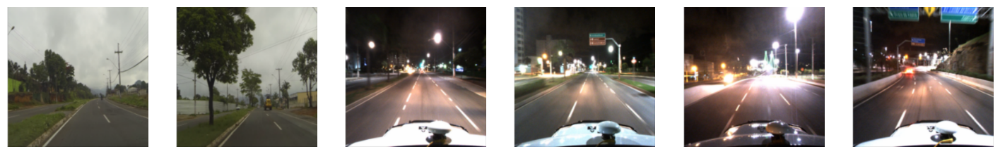

In [ ]:
plt.figure(figsize=(18, 6))
for i in range(6):
    j = 100*i + 1;
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[j])
plt.show();

In [ ]:
XX = np.transpose(X[0:3000:1], axes=(0, 3, 1, 2))
print(XX.shape)

(3000, 3, 256, 256)


In [ ]:
XXX = np.array(XX / 255, dtype='float32')

print(XXX.shape)

(3000, 3, 256, 256)


Downscale images and normalize

In [ ]:
h_new = w_new = 256 // 2
dataset_mean = (0.485, 0.456, 0.406)
dataset_std = (0.229, 0.224, 0.225)

In [ ]:
X_t =  torch.FloatTensor(XXX) # resize images and normalize
X_t = transforms.functional.resize(X_t,(128, 128))
for x in X_t:

  transforms.functional.normalize(x, (0.485, 0.456, 0.406), (0.229, 0.224, 0.225), inplace=True)


print(X_t.shape)

torch.Size([3000, 3, 128, 128])


In [ ]:
import gc

X = 0
XX = 0
XXX = 0
gc.collect()

4

Let's divide 3000 pictures by 2500/500 for training and validation respectively.

In [ ]:
ix = np.random.choice(len(X_t), len(X_t), False)
tr, val = np.split(ix, [2500])

Create dataloaders

In [ ]:
X_train_t = X_t[tr]
X_val_t = X_t[val]

train_dataset = TensorDataset(X_train_t, X_train_t)
val_dataset = TensorDataset(X_val_t, X_val_t)

train_dataloader = DataLoader(train_dataset, batch_size=256, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=256, shuffle=False)

In [ ]:
loaders = {"train": train_dataloader, "valid": val_dataloader}

-----

Below is a function for displaying pictures that have been normalized and stored in tensors.

In [ ]:
"""Inverse transform to obtain denormalized image from tensor with correct channels"""
def tensor2image(inp):
    inp = inp.numpy().transpose((1, 2, 0))
    inp = dataset_std * inp + dataset_mean
    inp = np.clip(inp, 0, 1)

    return inp

In [ ]:
"""Custom Imshow for tensors"""
def imshow(inp, title=None, plt_ax=plt, default=False):
    plt_ax.imshow(tensor2image(inp))
    if title is not None:
        plt_ax.set_title(title)
    plt_ax.grid(False)

Display one of the pictures after normalization to make sure all is correct

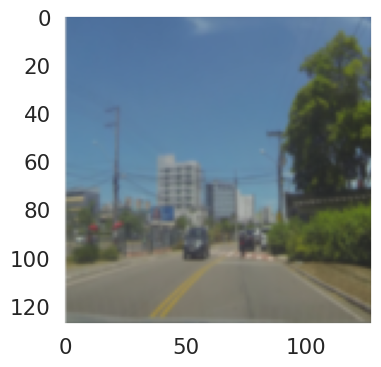

In [ ]:
item = next(iter(train_dataloader))[0]
imshow(item[0])

# Task 2. Describe Autoencoder From Lab 3

In [ ]:
class SimpleAutoencoder(nn.Module):
    def __init__(self, latent_channels):
        super().__init__()
        self.latent_channels = latent_channels

        # REQUIREMENT: The number of elements in the encoder output must be 16,384 when latent_channels = 64
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 16 , kernel_size = 3, stride = 2 , padding = 1),
            nn.ReLU(),
            nn.Conv2d(16 ,32 , 3, stride = 2 , padding = 1),
            nn.ReLU(),
            nn.Conv2d(32, latent_channels , 3, stride = 2, padding = 1),
            nn.ReLU(),

        )


        self.decoder = nn.Sequential(
            # Use nn.ConvTranspose2d and nn.ReLU blocks
            nn.ConvTranspose2d(latent_channels, 32 , kernel_size = 3, stride = 2 , padding = 1 , output_padding = 1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 16 , kernel_size = 3, stride = 2 , padding = 1 , output_padding = 1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 3 , kernel_size = 3, stride = 2 , padding = 1 , output_padding = 1),
            # nn.Sigmoid()
            # nn.Tanh()

        )

    def forward(self, x):
        z = self.encoder(x)
        out = self.decoder(z)
        return out

In [ ]:
def plot_example(X_batch, Y_pred, title):
    clear_output(wait=True)

    plt.rcParams["figure.figsize"] = (18,6)
    for k in range(6):
        plt.subplot(2, 6, k+1)
        plt.imshow(tensor2image(X_batch[k]))
        plt.title('Photo')
        plt.axis('off')

        if Y_pred != None:
            plt.subplot(2, 6, k+7)
            plt.imshow(tensor2image(Y_pred[k]))
            plt.title('Reconstructed')
            plt.axis('off')

    plt.suptitle(title)

    figure_name = title.split(',')[0]
    plt.savefig(f"{figure_name}.png")
    plt.show()

In [ ]:
import time
def save_model_wh(name, model):
    ts = time.time()
    path = '/content/gdrive/MyDrive/' + str(ts) + "_" + name + ".mw"
    torch.save(model.state_dict(), path)

In [ ]:
def train(name, model, optimizer, loss_fn, epochs, loaders, scheduler = None, save_params = False):
    losses = {"train": [], "valid": []}


    best_val_loss = float('inf')
    epochs_no_improve = 0
    best_model_state = None


    for epoch in range(epochs):
        print('* Epoch %d/%d' % (epoch+1, epochs))

        for stage, dataloader in loaders.items():
            avg_loss = 0

            if stage == 'train':
                model.train()
            else:
                model.eval()

            for X_batch, Y_batch in dataloader:
                X_batch = X_batch.to(device)
                Y_batch = Y_batch.to(device)

                if stage == 'train':
                    optimizer.zero_grad()
                    logits = model(X_batch)
                    loss = loss_fn(logits, Y_batch)
                    loss.backward()
                    optimizer.step()
                else:
                    with torch.no_grad():
                        logits = model(X_batch)
                        loss = loss_fn(logits, Y_batch)

                # calculate score and loss to show the user
                Y_pred = logits.detach()

                avg_loss += loss.detach().cpu().numpy() / len(dataloader)

                # clean GPU memory
                X_batch = X_batch.cpu()
                Y_batch = Y_batch.cpu()
                logits = logits.cpu()
                Y_pred = Y_pred.cpu()
                torch.cuda.empty_cache()

            losses[stage].append(avg_loss)

        if stage == 'valid':
            if save_params:
                save_model_wh(name, model)

            if (epoch + 1) % 2 == 0:
                if scheduler != None:
                    plot_example(X_batch, Y_pred, f"epoch {epoch+1} from {epochs}, avg_loss={avg_loss}, lr={scheduler.get_last_lr()[0]}")
                else:
                    plot_example(X_batch, Y_pred, f"epoch {epoch+1} from {epochs}, avg_loss={avg_loss}")
            else:
                if scheduler != None:
                    print(f"epoch {epoch+1}/{epochs}, avg_loss={avg_loss}, lr={scheduler.get_last_lr()[0]}")
                else:
                    print(f"epoch {epoch+1}/{epochs}, avg_loss={avg_loss}")

        val_loss = losses["valid"][-1]
        if scheduler != None:
            scheduler.step(val_loss)

        #  [OPTIONAL]
        if val_loss < best_val_loss - 1e-5:
            epochs_no_improve = 0
        #   [OPTIONAL]
        else:
            epochs_no_improve += 1

        if epochs_no_improve >= early_stopping_patience:
            print(f"Early stopping triggered at epoch {epoch+1}")
        #   [OPTIONAL]



    return losses

In [ ]:
def plot_losses(losses):

    plt.plot(range(len(losses['train'])), losses['train'], label="Train", linewidth=2)
    plt.plot(range(len(losses['valid'])), losses['valid'], label="Validation", linewidth=2)
    plt.legend()
    plt.xlabel("Epoch")

    plt.show()

# Task 3. Smaller Autoencoder

In [ ]:
model32 = SimpleAutoencoder(latent_channels=32).to(device)
optimizer = torch.optim.Adam(model32.parameters(), lr=0.01)
criterion = nn.MSELoss()

In [ ]:

early_stopping_patience = 10
epochs_no_improve = 0

Now let us train it to have loss <= 0.05 on val dataset

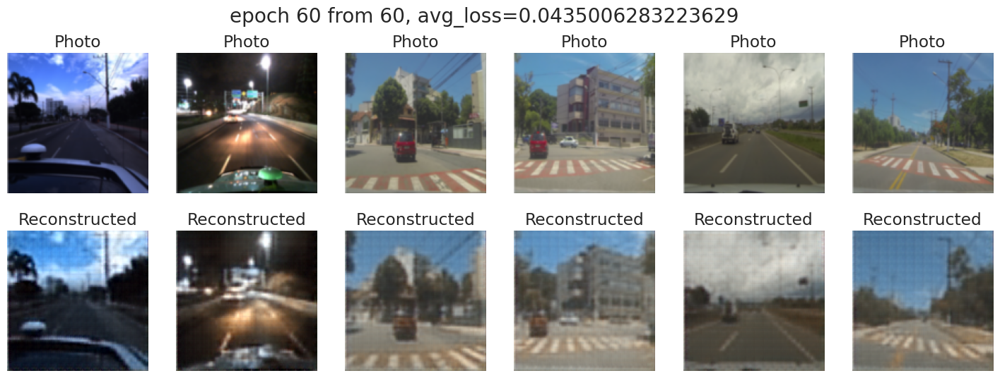

In [ ]:
losses11 = train('MODEL32', model32, optimizer, criterion, 60, loaders, scheduler = None, save_params = True) # TODO train

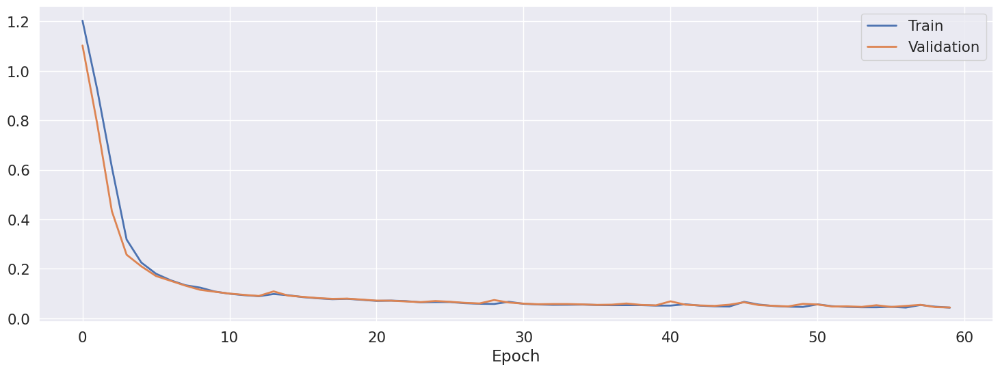

In [ ]:
plot_losses(losses11)

In [ ]:
### 1744463920.9600737_MODEL32.mw

# Task 2. Load model64 from Lab 3

Load model from Lab 3, which must be trained to have the loss is less than or equal to 0.01

In [ ]:
model64 = SimpleAutoencoder(latent_channels=64).to(device)
model64.load_state_dict(torch.load('/content/gdrive/MyDrive/1744462821.0066183_Enhance_quality.mw', weights_only=True)) 

<All keys matched successfully>

In [ ]:
def Check(name, model, loss_fn):
    losses = []
    avg_loss = 0
    for X_batch, Y_batch in val_dataloader:
        X_batch = X_batch.to(device)
        Y_batch = Y_batch.to(device)


        with torch.no_grad():
            logits = model(X_batch)
            loss = loss_fn(logits, Y_batch)

        Y_pred = logits.detach()

        avg_loss += loss.detach().cpu().numpy() / len(val_dataloader)

        # clean GPU memory
        X_batch = X_batch.cpu()
        Y_batch = Y_batch.cpu()
        logits = logits.cpu()
        Y_pred = Y_pred.cpu()
        torch.cuda.empty_cache()

    return avg_loss

In [ ]:
criterion = nn.MSELoss()
losses2 =Check('model64', model64,  criterion)

In [ ]:
losses2

np.float32(0.00999321)

# Task 3. Compare clustering performance

In [ ]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

In [ ]:
features = []

model64.eval()
with torch.no_grad():
    for x, _ in val_dataloader:
        latent_features = model64.encoder(x.to(device))
        latent_features = latent_features.view(x.size(0), -1).cpu()
        features.append(latent_features)
        x = x.cpu()

features = torch.cat(features)

In [ ]:
# use TSNE with n_components=2, perplexity=30 and fix random_state = 42
tsne = TSNE (n_components=2, perplexity=30 , random_state = 42)
features_2d = tsne.fit_transform(features) # TODO

In [ ]:
#  use KMeans to find 6 clustets + fix random_state
n_clusters = 6
kmeans = KMeans(n_clusters , random_state = 42) 
kmeans.fit(features)
cluster_labels = kmeans.predict(features) 

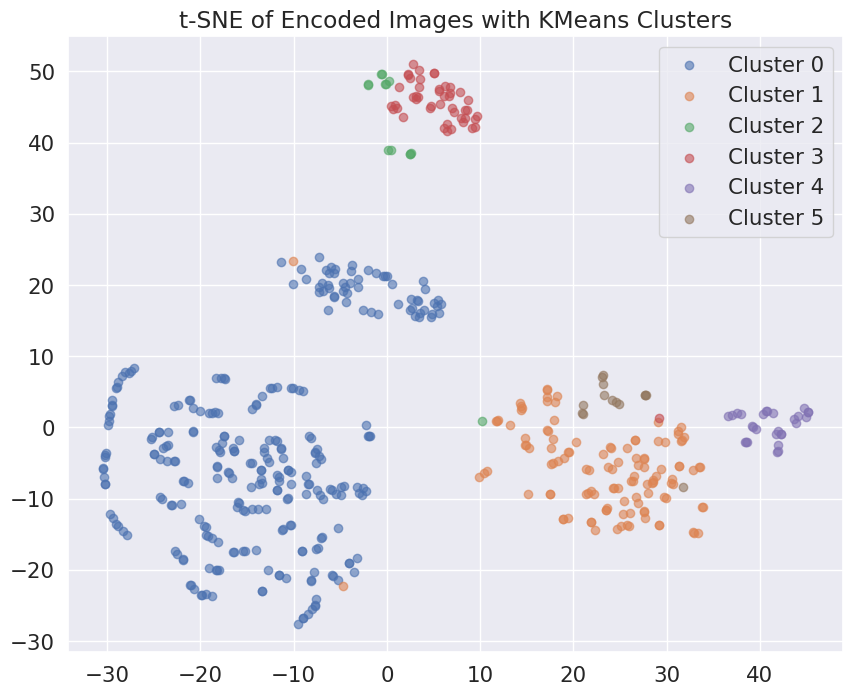

In [ ]:
# Отображение t-SNE
plt.figure(figsize=(10, 8))
for i in range(n_clusters):
    idxs = np.where(cluster_labels == i)
    plt.scatter(features_2d[idxs, 0], features_2d[idxs, 1], label=f'Cluster {i}', alpha=0.6)
plt.legend()
plt.title("t-SNE of Encoded Images with KMeans Clusters")
plt.show()

In [ ]:
model32 = SimpleAutoencoder(latent_channels=32).to(device)
model32.load_state_dict(torch.load('/content/gdrive/MyDrive/1744463920.9600737_MODEL32.mw', weights_only=True))

<All keys matched successfully>

In [ ]:
features32 = []

model32.eval()
with torch.no_grad():
    for x, _ in val_dataloader:
        
        latent_features = model32.encoder(x.to(device))
        latent_features = latent_features.view(x.size(0), -1).cpu()
        features32.append(latent_features)
        x = x.cpu()

features32 = torch.cat(features32)

In [ ]:
tsne = TSNE (n_components=2, perplexity=30 , random_state = 42)
features_2d32 = tsne.fit_transform(features32) 

In [ ]:
n_clusters = 6
kmeans = KMeans(n_clusters , random_state = 42) 
kmeans.fit(features32)
cluster_labels32 = kmeans.predict(features32) 

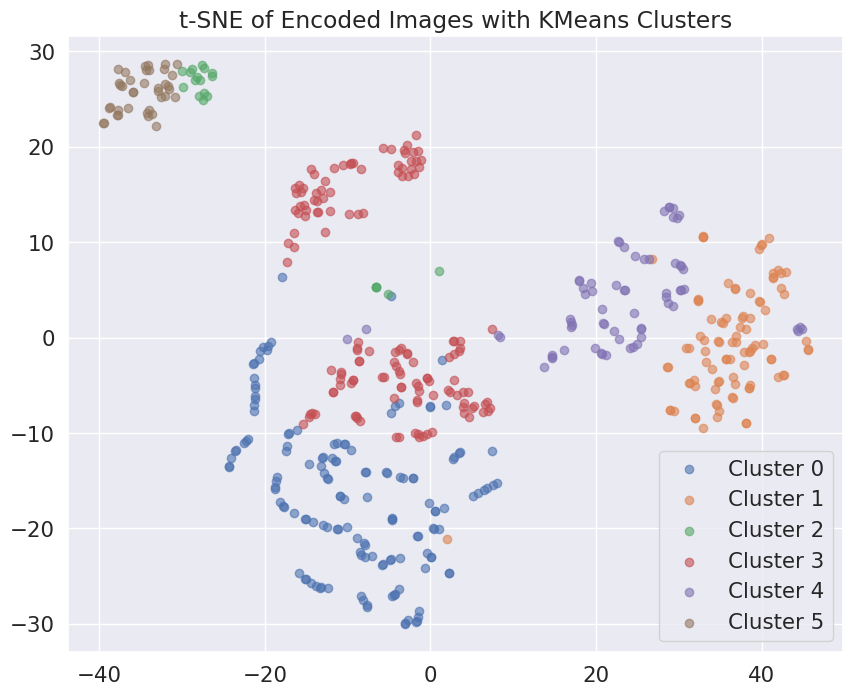

In [ ]:
# Отображение t-SNE
plt.figure(figsize=(10, 8))
for i in range(n_clusters):
    idxs = np.where(cluster_labels32 == i)
    plt.scatter(features_2d32[idxs, 0], features_2d32[idxs, 1], label=f'Cluster {i}', alpha=0.6)
plt.legend()
plt.title("t-SNE of Encoded Images with KMeans Clusters")
plt.show()

Comparison: Clusters in the model are visibly more compact and well-separated, while we got more overlapping between clusters in the second, especially between clusters 0 and 3, as well as clusters 1 and 4. Also, density of points within clusters in the first model is more consistent than in the second.

# Task 4. Image Fusion

Check image fusion for model64

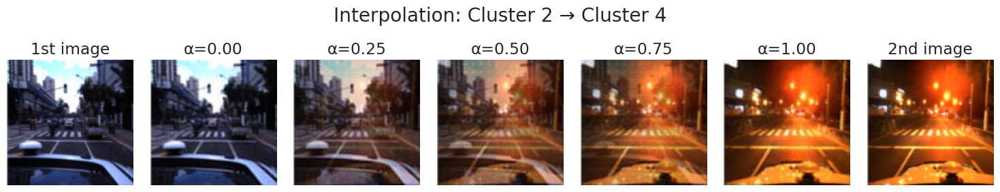

In [ ]:
import random

# Make sure we select two different clusters
unique_clusters = np.unique(cluster_labels)
cluster_a, cluster_b = np.random.choice(unique_clusters, size=2, replace=False)

# Get indices of images in each of the two clusters
idxs_a = np.where(cluster_labels == cluster_a)[0]
idxs_b = np.where(cluster_labels == cluster_b)[0]

# Randomly select one image from each cluster
i1 = np.random.choice(idxs_a)
i2 = np.random.choice(idxs_b)

z1 = features[i1]
z2 = features[i2]

# Interpolation between two latent vectors
interpolated = [(1 - alpha) * z1 + alpha * z2 for alpha in np.linspace(0, 1, 5)]

# Generation and visualization
fig, axes = plt.subplots(1, 7, figsize=(15, 3))
img = X_val_t[i1]
axes[0].imshow(tensor2image(img))
axes[0].axis("off")
axes[0].set_title("1st image")

for i, z in enumerate(interpolated):
    z = z.to(device).unsqueeze(0)
    with torch.no_grad():
        z = z =  z.view(1, model64.latent_channels, 16, 16) 
        decoded =  model64.decoder(z) 
        img = decoded.squeeze(0).cpu()
        img = tensor2image(img)
    axes[i+1].imshow(img)
    axes[i+1].axis("off")
    axes[i+1].set_title(f"α={np.linspace(0,1,5)[i]:.2f}")

img = X_val_t[i2]
axes[6].imshow(tensor2image(img))
axes[6].axis("off")
axes[6].set_title("2nd image")

plt.suptitle(f"Interpolation: Cluster {cluster_a} → Cluster {cluster_b}")
plt.tight_layout()
plt.show()

In [ ]:
#  Interpolation with model32

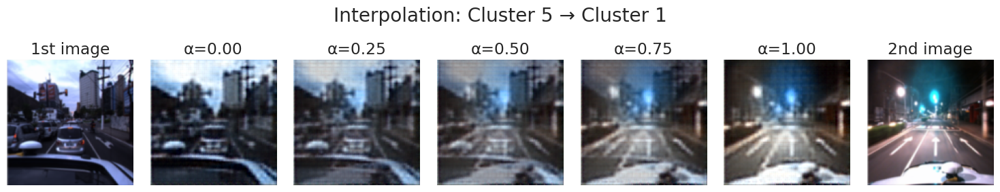

In [ ]:
import random

# Make sure we select two different clusters
unique_clusters = np.unique(cluster_labels32)
cluster_a, cluster_b = np.random.choice(unique_clusters, size=2, replace=False)

# Get indices of images in each of the two clusters
idxs_a = np.where(cluster_labels32 == cluster_a)[0]
idxs_b = np.where(cluster_labels32 == cluster_b)[0]

# Randomly select one image from each cluster
i1 = np.random.choice(idxs_a)
i2 = np.random.choice(idxs_b)

z1 = features32[i1]
z2 = features32[i2]

# Interpolation between two latent vectors
interpolated = [(1 - alpha) * z1 + alpha * z2 for alpha in np.linspace(0, 1, 5)]

# Generation and visualization
fig, axes = plt.subplots(1, 7, figsize=(15, 3))
img = X_val_t[i1]
axes[0].imshow(tensor2image(img))
axes[0].axis("off")
axes[0].set_title("1st image")

for i, z in enumerate(interpolated):
    z = z.to(device).unsqueeze(0)
    with torch.no_grad():
        z = z =  z.view(1, model32.latent_channels, 16, 16) 
        decoded =  model32.decoder(z) 
        img = decoded.squeeze(0).cpu()
        img = tensor2image(img)
    axes[i+1].imshow(img)
    axes[i+1].axis("off")
    axes[i+1].set_title(f"α={np.linspace(0,1,5)[i]:.2f}")

img = X_val_t[i2]
axes[6].imshow(tensor2image(img))
axes[6].axis("off")
axes[6].set_title("2nd image")

plt.suptitle(f"Interpolation: Cluster {cluster_a} → Cluster {cluster_b}")
plt.tight_layout()
plt.show()

Comparison: In the first one, there is a clear progression from day to night and lighting gradually shifts from natural daylight to artificial streetlights. In the second model also the lighting changes from natural to artificial, but unlike the first interpolation, the transition favors cooler tones. As a result, both models appear capable of generating meaningful interpolations between clusters.

# Task 5. Check Latent Space Vector Arithmetic

Check is Latent Space Vector Arithmetic working for model64

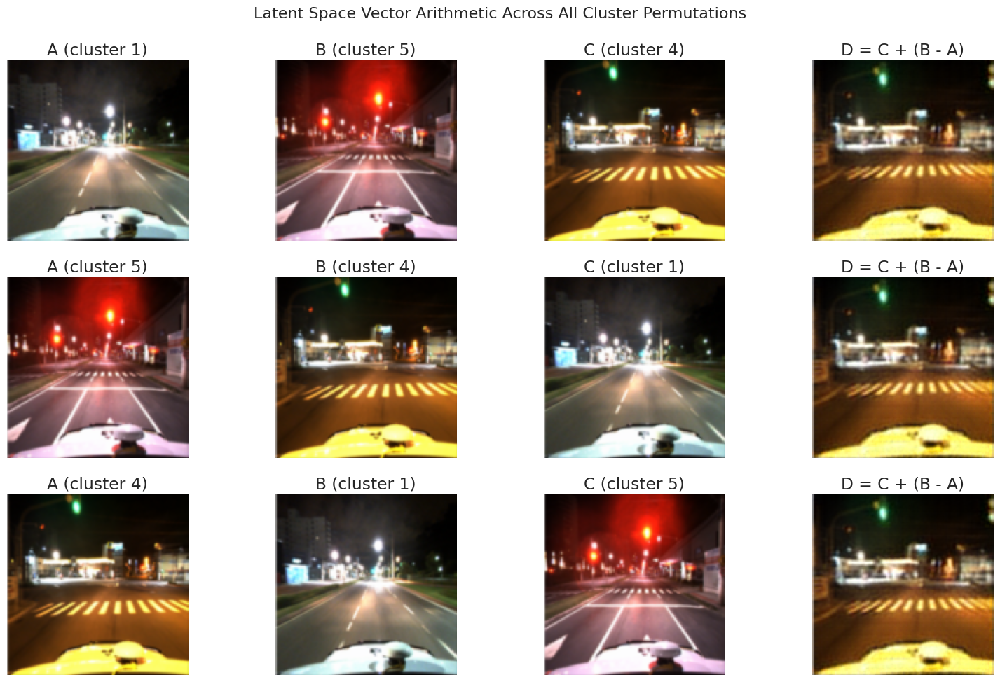

In [ ]:
# Select 3 different clusters
selected_clusters = np.random.choice(np.unique(cluster_labels), size=3, replace=False)
cluster_a, cluster_b, cluster_c = selected_clusters

# Select one random index from each cluster
idx_a = np.random.choice(np.where(cluster_labels == cluster_a)[0])
idx_b = np.random.choice(np.where(cluster_labels == cluster_b)[0])
idx_c = np.random.choice(np.where(cluster_labels == cluster_c)[0])

# Get corresponding images and latent vectors
img_a = X_val_t[idx_a]
img_b = X_val_t[idx_b]
img_c = X_val_t[idx_c]

z_a = features[idx_a]
z_b = features[idx_b]
z_c = features[idx_c]

# Scenarios: (A,B,C), (B,C,A), (C,A,B)
triplets = [
    (z_a, z_b, z_c, img_a, img_b, img_c, f"{cluster_a}", f"{cluster_b}", f"{cluster_c}"),
    (z_b, z_c, z_a, img_b, img_c, img_a, f"{cluster_b}", f"{cluster_c}", f"{cluster_a}"),
    (z_c, z_a, z_b, img_c, img_a, img_b, f"{cluster_c}", f"{cluster_a}", f"{cluster_b}"),
]

# Visualization
fig, axes = plt.subplots(3, 4, figsize=(16, 10))

for row, (z1, z2, z3, img1, img2, img3, cl1, cl2, cl3) in enumerate(triplets):
    # Compute: z4 = z3 + (z2 - z1)
    z4 = z3 + (z2 - z1)
    z4 = z4.to(device).unsqueeze(0)

    # Reconstruct image from latent vector
    with torch.no_grad():
        z4 = z.view(1, model64.latent_channels, 16, 16)
        decoded = model64.decoder(z4).squeeze(0).cpu() 

    # List of images and titles
    imgs = [img1, img2, img3, decoded]
    titles = [
        f"A (cluster {cl1})",
        f"B (cluster {cl2})",
        f"C (cluster {cl3})",
        "D = C + (B - A)"
    ]

    for col in range(4):
        axes[row, col].imshow(tensor2image(imgs[col]))
        axes[row, col].axis('off')
        axes[row, col].set_title(titles[col])

plt.suptitle("Latent Space Vector Arithmetic Across All Cluster Permutations", fontsize=16)
plt.tight_layout()
plt.show()


In the image A (Cluster 1), the scene is relatively dark but well-lit and there's no red traffic light. while in the image B (Cluster 5), ther is a similar street scene but with a strong red glow and the lighting is warmer. The difference (B - A) is the introduction of red lighting and a shift from cool to warm tones. The result of C+(B-A) retains the structure of C but has inherited the lighting shift from the difference (B - A).

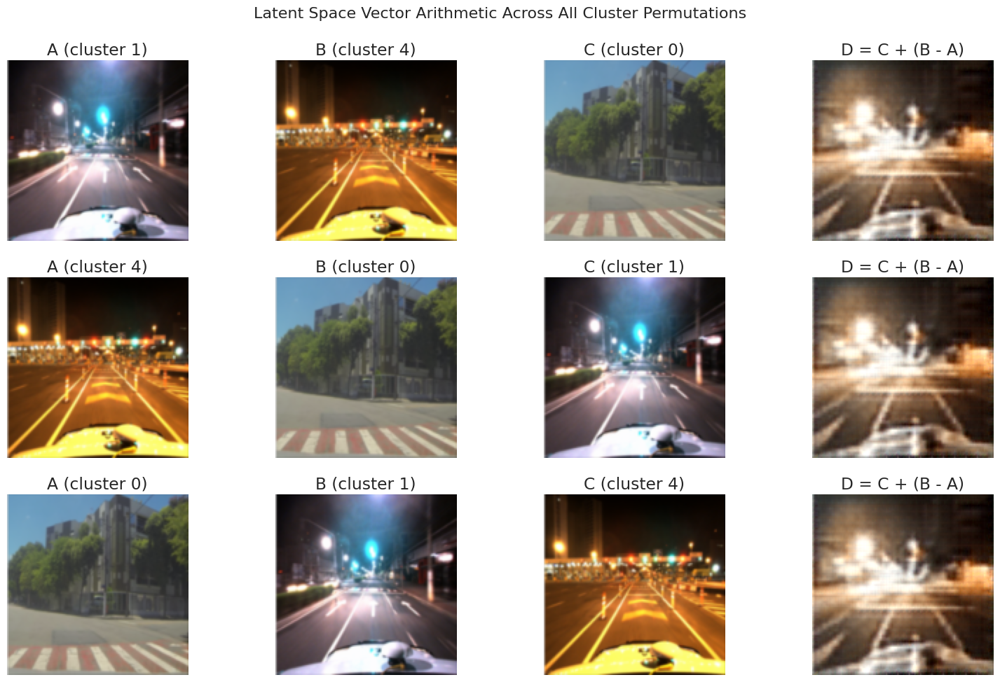

In [ ]:
# Select 3 different clusters
selected_clusters = np.random.choice(np.unique(cluster_labels32), size=3, replace=False)
cluster_a, cluster_b, cluster_c = selected_clusters

# Select one random index from each cluster
idx_a = np.random.choice(np.where(cluster_labels32 == cluster_a)[0])
idx_b = np.random.choice(np.where(cluster_labels32 == cluster_b)[0])
idx_c = np.random.choice(np.where(cluster_labels32 == cluster_c)[0])

# Get corresponding images and latent vectors
img_a = X_val_t[idx_a]
img_b = X_val_t[idx_b]
img_c = X_val_t[idx_c]

z_a = features32[idx_a]
z_b = features32[idx_b]
z_c = features32[idx_c]

# Scenarios: (A,B,C), (B,C,A), (C,A,B)
triplets = [
    (z_a, z_b, z_c, img_a, img_b, img_c, f"{cluster_a}", f"{cluster_b}", f"{cluster_c}"),
    (z_b, z_c, z_a, img_b, img_c, img_a, f"{cluster_b}", f"{cluster_c}", f"{cluster_a}"),
    (z_c, z_a, z_b, img_c, img_a, img_b, f"{cluster_c}", f"{cluster_a}", f"{cluster_b}"),
]

# Visualization
fig, axes = plt.subplots(3, 4, figsize=(16, 10))

for row, (z1, z2, z3, img1, img2, img3, cl1, cl2, cl3) in enumerate(triplets):
    # Compute: z4 = z3 + (z2 - z1)
    z4 = z3 + (z2 - z1)
    z4 = z4.to(device).unsqueeze(0)

    # Reconstruct image from latent vector
    with torch.no_grad():
        z4 = z.view(1, model32.latent_channels, 16, 16)
        decoded = model32.decoder(z4).squeeze(0).cpu() 

    # List of images and titles
    imgs = [img1, img2, img3, decoded]
    titles = [
        f"A (cluster {cl1})",
        f"B (cluster {cl2})",
        f"C (cluster {cl3})",
        "D = C + (B - A)"
    ]

    for col in range(4):
        axes[row, col].imshow(tensor2image(imgs[col]))
        axes[row, col].axis('off')
        axes[row, col].set_title(titles[col])

plt.suptitle("Latent Space Vector Arithmetic Across All Cluster Permutations", fontsize=16)
plt.tight_layout()
plt.show()


Here we have from the first row the diffrence D = C + (B - A) transforms the scene to night and injects orange lighting and construction elements, even though the base is daytime. Very similar to B structurally but with lighting from C. In general we got from the first model a better lighting transfer.

# Task 8. Denoising

Denoise with model64

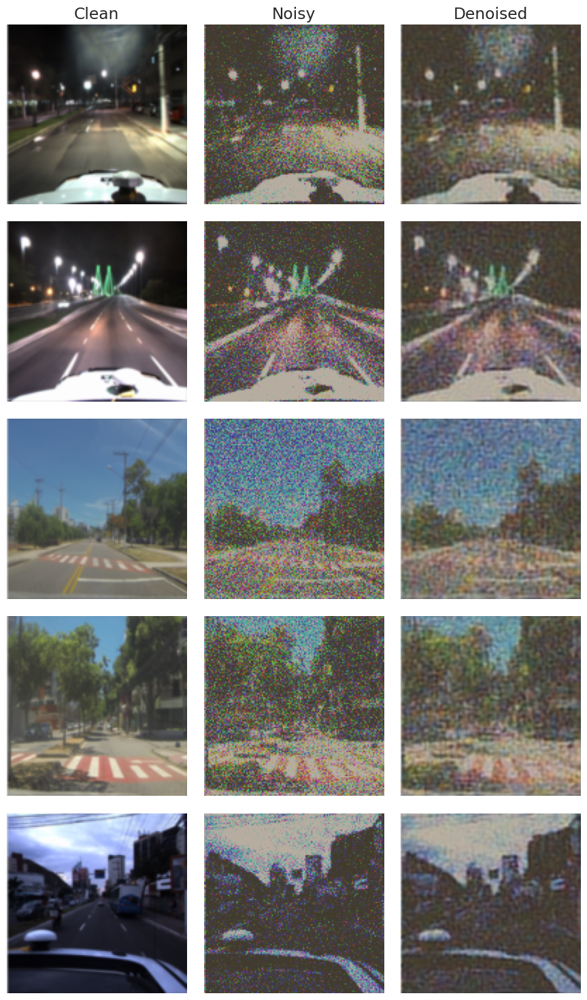

In [ ]:
model64.eval()
images_clean,_ = next(iter(val_dataloader))

# Add noise
noise_level = 0.7  # от 0 (чисто) до 1 (много шума)
noisy_images = images_clean + noise_level * torch.randn_like(images_clean)
noisy_images = torch.clamp(noisy_images, -1.0, 1.0)  # учитываем нормализацию [-1, 1]

# Use autoencoder to denoise
with torch.no_grad():
    noisy_images = noisy_images.to(device)
    denoised_images = model64(noisy_images)
    if len(denoised_images) == 2:
        denoised_images = denoised_images[0]
    denoised_images = denoised_images.cpu()
    noisy_images = noisy_images.cpu()

# Vizualize the results
def show_images(clean, noisy, denoised, num_images=5):
    clean = clean[:num_images].cpu()
    noisy = noisy[:num_images].cpu()
    denoised = denoised[:num_images].cpu()

    fig, axes = plt.subplots(num_images, 3, figsize=(9, num_images * 3))
    for i in range(num_images):
        for j, img_tensor in enumerate([clean[i], noisy[i], denoised[i]]):
            img = tensor2image(img_tensor)
            axes[i, j].imshow(img)
            axes[i, j].axis('off')
            if i == 0:
                axes[i, 0].set_title('Clean')
                axes[i, 1].set_title('Noisy')
                axes[i, 2].set_title('Denoised')
    plt.tight_layout()
    plt.show()

show_images(images_clean, noisy_images, denoised_images)


Calculate mse between

1.   Original image and noised
2.   Original image and reconstructed with model64
3.   Original image and reconstructed with model32



In [ ]:
import torch.nn.functional as F


mse_noisy = F.mse_loss(noisy_images, images_clean).item()

# MSE между чистым и восстановленным (насколько хорошо автоэнкодер восстановил)
mse_denoised = F.mse_loss(denoised_images, images_clean).item()

print(f"MSE (Clean vs Noisy):     {mse_noisy:.6f}")
print(f"MSE (Clean vs Denoised):  {mse_denoised:.6f}")


MSE (Clean vs Noisy):     0.419401
MSE (Clean vs Denoised):  0.256545


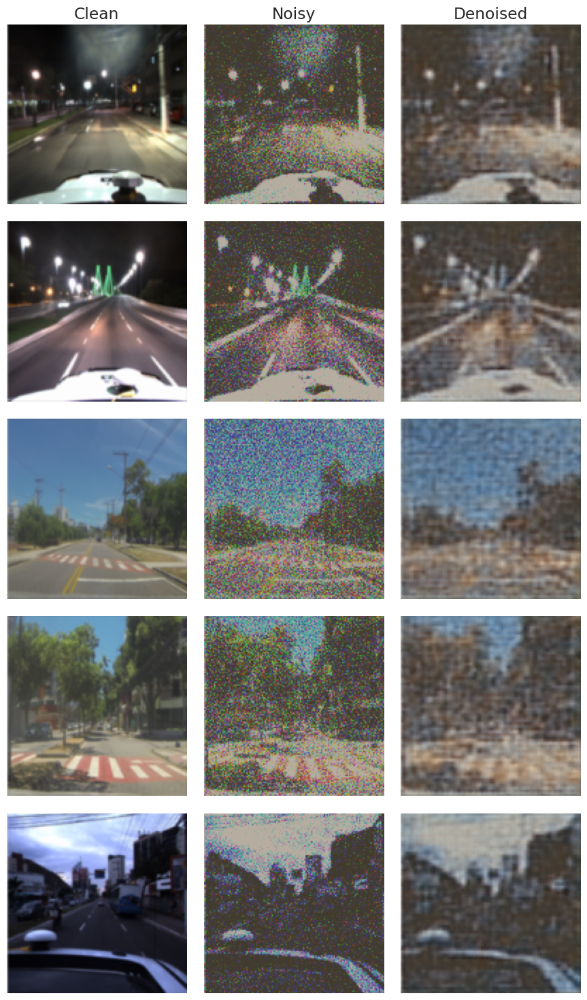

In [ ]:
model32.eval()

with torch.no_grad():
    noisy_images = noisy_images.to(device)
    denoised_images32 = model32(noisy_images)
    if len(denoised_images32) == 2:
        denoised_images32 = denoised_images32[0]
    denoised_images32 = denoised_images32.cpu()
    noisy_images = noisy_images.cpu()


show_images(images_clean, noisy_images, denoised_images32)

In [ ]:
mse_denoised32 = F.mse_loss(denoised_images32, images_clean).item()

print(f"MSE (Clean vs Denoised32):  {mse_denoised32:.6f}")

MSE (Clean vs Denoised32):  0.273829


Here obviously we notice that the first model was better at restoring the features from images after denoising, while the second one gives images with a lower quality. Additionlly, this is can be seen from the MSE which was less between the original images and the the denoised images using model64.